<a href="https://colab.research.google.com/github/Emanuelj2/Self_Driving_Car/blob/main/self_Driving_Car.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Import the needed libraries

In [ ]:
#clone the data from github
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163 (from 1)
Receiving objects: 100% (12163/12163), 156.98 MiB | 11.80 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir ,'driving_log.csv'), names = columns)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.615438


### Remove the path


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


### Show the distribution

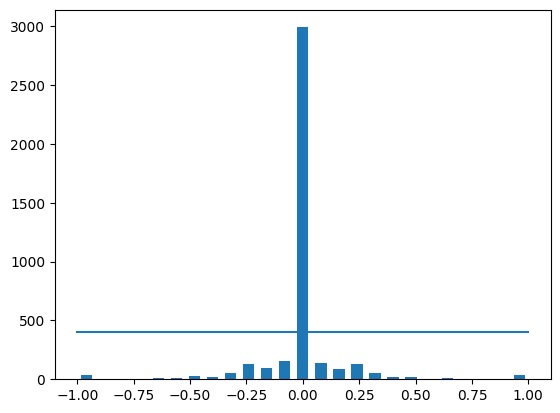

In [ ]:
num_of_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_of_bins)
center = (bins[: -1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 4053
(4053, 7)


### Remove some zeros to balance out the data set

In [ ]:
remove_list = []
for i in range(num_of_bins):
  list_ = []
  for j in range(len(data['steering'])):
    if data['steering'][j] >= bins[i] and data['steering'][j] <= bins[i + 1]:
      list_.append(j)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed: ', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining: ', len(data))

removed:  2590
remaining:  1463


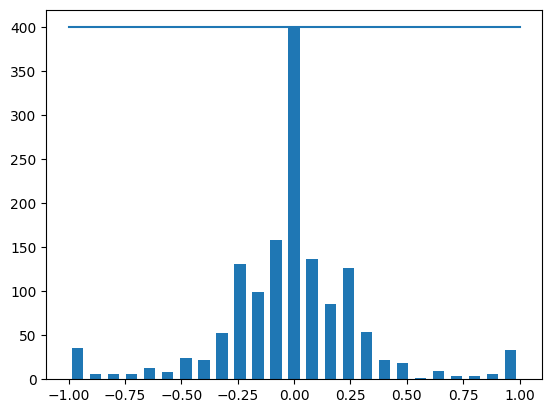

In [ ]:
hist, _ = np.histogram(data['steering'], (num_of_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
def load_img_sterring(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    index_data = data.iloc[i]
    center, left, right = index_data[0], index_data[1], index_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(index_data[3]))
    #left img append
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(index_data[3])+0.15)
    #right img append
    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(index_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings


In [ ]:
image_paths, steerings = load_img_sterring(datadir + '/IMG', data)

<ipython-input-9-7de3f75be377>:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = index_data[0], index_data[1], index_data[2]
<ipython-input-9-7de3f75be377>:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(index_data[3]))
<ipython-input-9-7de3f75be377>:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(index_data[3])+0.15)
<ipython-input-9-7de3f75be377>:14: FutureWarning

In [ ]:
len(image_paths)

4389

###Training & Validation

In [ ]:
x_train, x_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('train samples: {}\nValid Samples: {}.'.format(len(x_train), len(x_valid)))

train samples: 3511
Valid Samples: 878.


###plot the distribution

Text(0.5, 1.0, 'Validation_set')

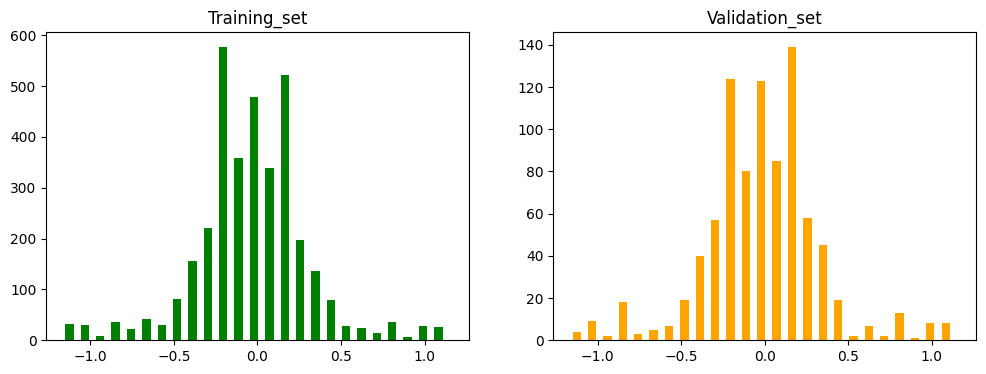

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_of_bins, width=0.05, color='green')
axes[0].set_title('Training_set')
axes[1].hist(y_valid, bins=num_of_bins, width=0.05, color='orange')
axes[1].set_title('Validation_set')


###Zooming image

Text(0.5, 1.0, 'Zoomed_Image')

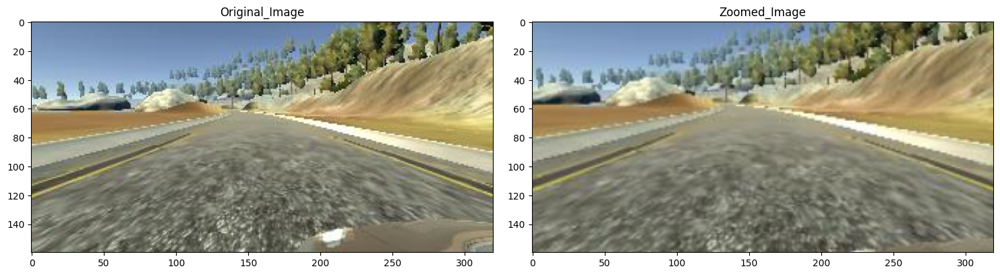

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale=(1,1.3))
  image =zoom.augment_image(image)
  return image

#select a random image to visualize
image = image_paths[random.randint(0 , 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

#visualize the image
fig, axs = plt.subplots(1, 2, figsize=(15 ,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed_Image')

###pan the image

Text(0.5, 1.0, 'Panned_Image')

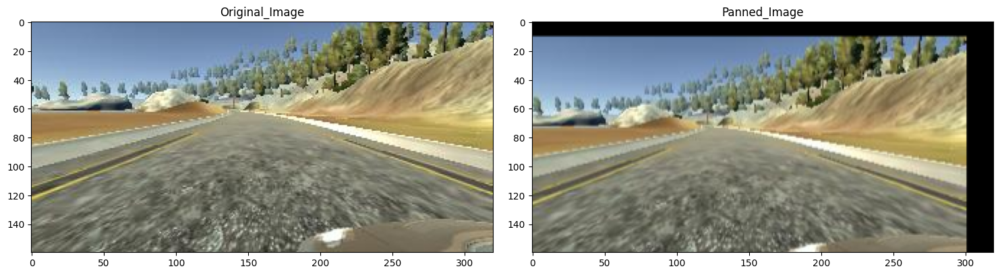

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y" : (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

#select a random image to visualize
image = image_paths[random.randint(0 , 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

#visualize the image
fig, axs = plt.subplots(1, 2, figsize=(15 ,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned_Image')

###Random brightness

Text(0.5, 1.0, 'brightness_altered_image')

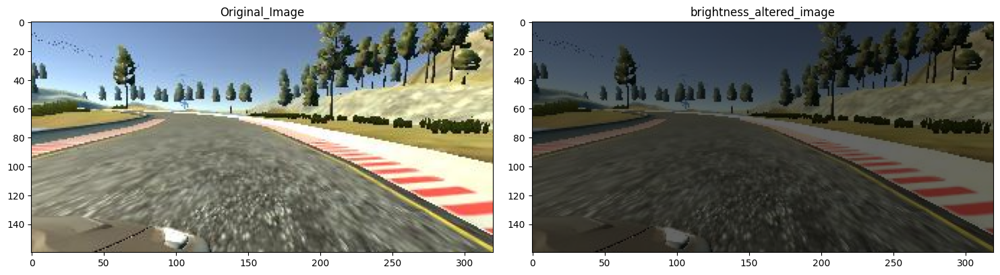

In [ ]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

#select a random image to visualize
image = image_paths[random.randint(0 , 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

#visualize the image
fig, axs = plt.subplots(1, 2, figsize=(15 ,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('brightness_altered_image')


###Flip the image

Text(0.5, 1.0, 'Fliped_Image - steering_Angle:0.2202122')

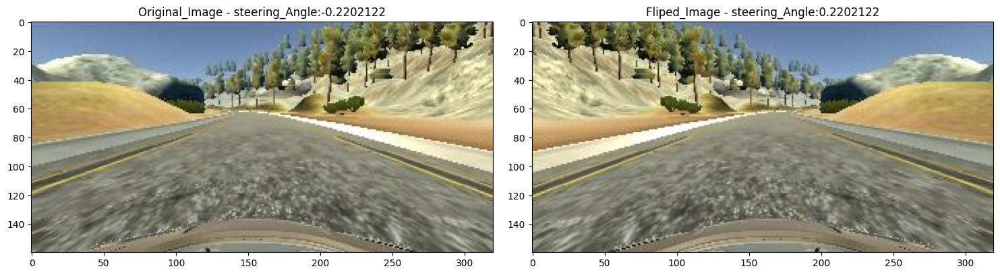

In [ ]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)
  steering_angle = -steering_angle
  return image, steering_angle

#select the random image
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
fliped_image, flipped_sterring_angle = img_random_flip(original_image, steering_angle)

#visualize the image
fig, axs = plt.subplots(1, 2, figsize=(15 ,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_Image - ' + 'steering_Angle:' + str(steering_angle))

axs[1].imshow(fliped_image)
axs[1].set_title('Fliped_Image - ' + 'steering_Angle:' + str(flipped_sterring_angle))


###Call Aumentation Technique

In [ ]:
def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

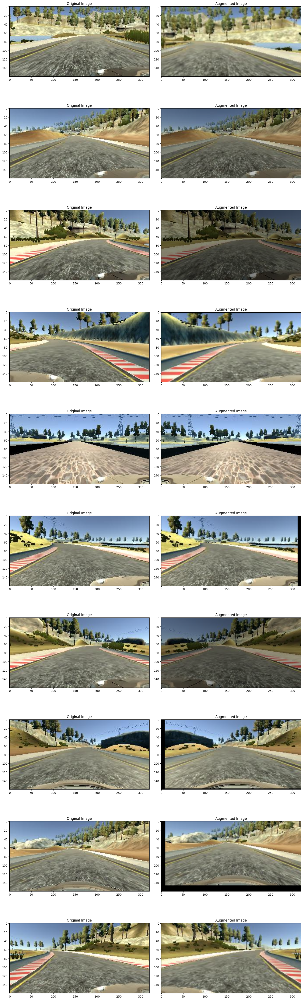

In [ ]:
nrow = 10
ncol = 2

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")


###Pre-Processing

In [ ]:
#Note this is the format for the nvidia model
def img_preprocess(image):
  image = image[60:135,:,:]
  image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
  image = cv2.GaussianBlur(image, (3, 3), 0)
  image = cv2.resize(image, (200, 66))
  image = image/255
  return image

Text(0.5, 1.0, 'preprocessed_image')

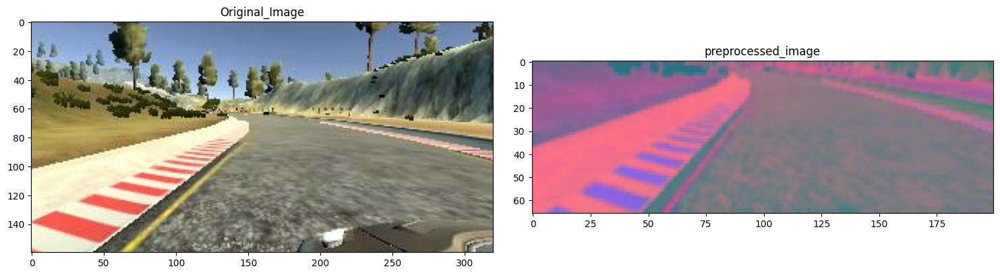

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

#visualize image
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original_Image')

axs[1].imshow(preprocessed_image)
axs[1].set_title('preprocessed_image')

###Batch Genorator

In [ ]:
def batch_genorator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im= mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield(np.asarray(batch_img), np.asarray(batch_steering))

In [ ]:
x_train_gen, y_train_gen = next(batch_genorator(x_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_genorator(x_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation_Image')

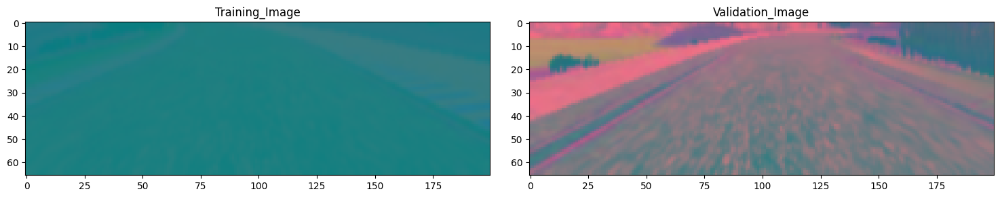

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training_Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation_Image')

###Nvidia Model

In [ ]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))


  model.add(Flatten())

  model.add(Dense(100, activation='elu'))

  model.add(Dense(50, activation='elu'))

  model.add(Dense(10, activation='elu'))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model= nvidia_model()
print(model.summary())

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 1, 18, 64)           │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
history = model.fit(
    batch_genorator(x_train, y_train, 100, 1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_genorator(x_valid, y_valid, 100, 0),
    validation_steps=200,
    verbose=1,
    shuffle=True
)


Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 333s 1s/step - loss: 0.3540 - val_loss: 0.0817
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 320s 1s/step - loss: 0.0839 - val_loss: 0.0743
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 321s 1s/step - loss: 0.0730 - val_loss: 0.0494
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 321s 1s/step - loss: 0.0620 - val_loss: 0.0378
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 316s 1s/step - loss: 0.0532 - val_loss: 0.0350
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 317s 1s/step - loss: 0.0504 - val_loss: 0.0333
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 316s 1s/step - loss: 0.0465 - val_loss: 0.0357
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 315s 1s/step - loss: 0.0445 - val_loss: 0.0281
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 323s 1s/step - loss: 0.0434 - val_loss: 0.0303
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 320s 1s/step - loss: 0.0409 - val_loss: 0.0300


Text(0.5, 0, 'Epoch')

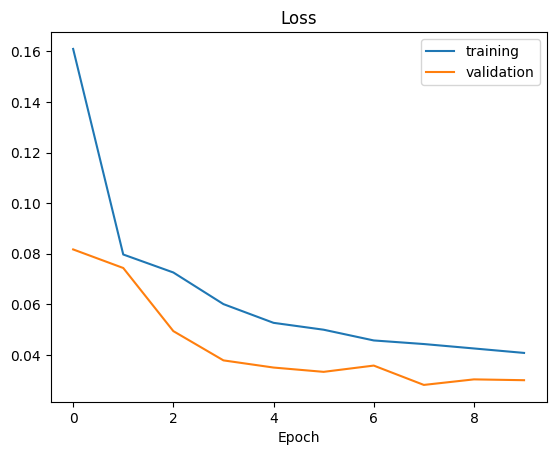

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>